In [1]:
from __future__ import division, print_function
import sys, os, glob, time, warnings, gc
import matplotlib.pyplot as plt
import numpy as np
from astropy.table import Table, vstack, hstack
import fitsio
from astropy.io import fits
import healpy as hp
from astropy import wcs

In [2]:
params = {'legend.fontsize': 'large',
         'axes.labelsize': 'large',
         'axes.titlesize':'large',
         'xtick.labelsize':'large',
         'ytick.labelsize':'large',
         'figure.facecolor':'w'} 
plt.rcParams.update(params)

In [3]:
fringe_dir = '/global/homes/d/djschleg/cosmo/staging/decam/DECam_CP-Fringe'
image_dir = '/global/project/projectdirs/cosmo/staging/'
surveyccd_path = '/global/project/projectdirs/cosmo/work/legacysurvey/dr9/survey-ccds-decam-dr9-cut.fits.gz'
blob_dir = '/global/project/projectdirs/desi/users/rongpu/dr9/decam_ccd_blob_mask'

sky_dir = '/global/project/projectdirs/desi/users/rongpu/dr9/fringe/smooth_sky'
plot_dir = '/global/project/projectdirs/desi/users/rongpu/dr9/fringe/plots'
data_dir = '/global/project/projectdirs/desi/users/rongpu/dr9/fringe/data'

In [20]:
1148265*12/60/60

3827.55

In [4]:
# tmp = fitsio.read(surveyccd_path, columns=['expnum'])
# idx = np.where(tmp['expnum']==256175)[0]
# ccd = fitsio.read(surveyccd_path, rows=idx)

ccd = fitsio.read(surveyccd_path)
ccd = Table(ccd)
mask = ccd['ccd_cuts']==0
mask &= ccd['filter']=='z'
ccd = ccd[mask]
print(len(ccd))

# Select exposures with 61 CCDs
tmp1, tmp2 = np.unique(ccd['expnum'], return_counts=True)
mask = tmp2==61
mask1 = np.in1d(ccd['expnum'], tmp1[mask])
ccd = ccd[mask1]
print(len(ccd))

expnum = ccd['expnum'][-1]
mask = ccd['expnum']==expnum
ccd = ccd[mask]
print(len(ccd))

1148265
566934
61


In [5]:
ccd_index = 0
hdu_index = ccd['image_hdu'][ccd_index]

fringe = np.load(os.path.join(data_dir, 'fringe_{}.npy'.format(hdu_index)))
img_fn = os.path.join(image_dir, ccd['image_filename'][ccd_index]).strip()
str_loc = str.find(img_fn, '_ooi_')
ood_fn = img_fn[:str_loc] + '_ood_' + img_fn[str_loc+5:]
print(ood_fn)
hdulist = fits.open(ood_fn)
ood = hdulist[hdu_index].data
print('Fraction of masked pixels:', np.sum(ood!=0)/len(ood.flatten()))

fringe_masked = fringe.copy()
fringe_masked[ood!=0] = np.nan

/global/project/projectdirs/cosmo/staging/decam/CP/V4.8.2/CP20170327/c4d_170328_100215_ood_z_ls9.fits.fz
Fraction of masked pixels: 0.040087274561


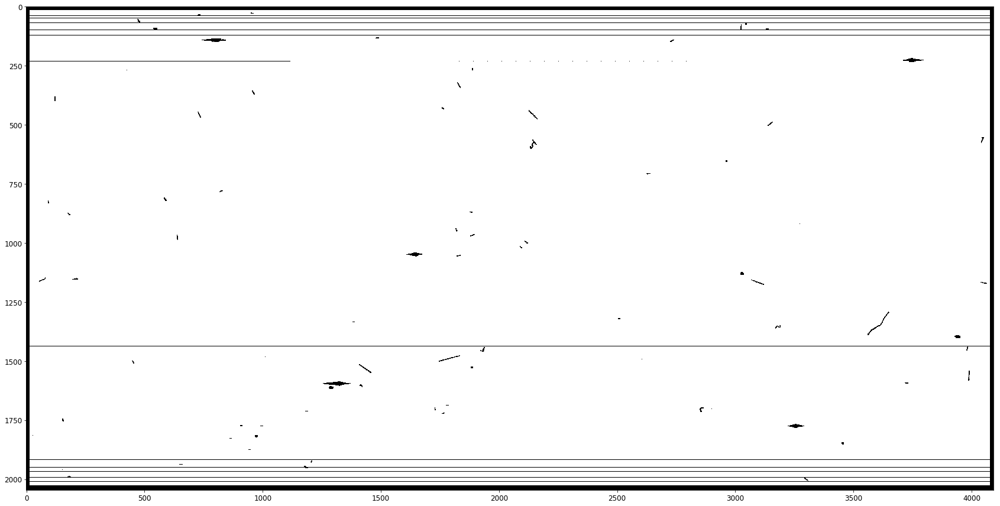

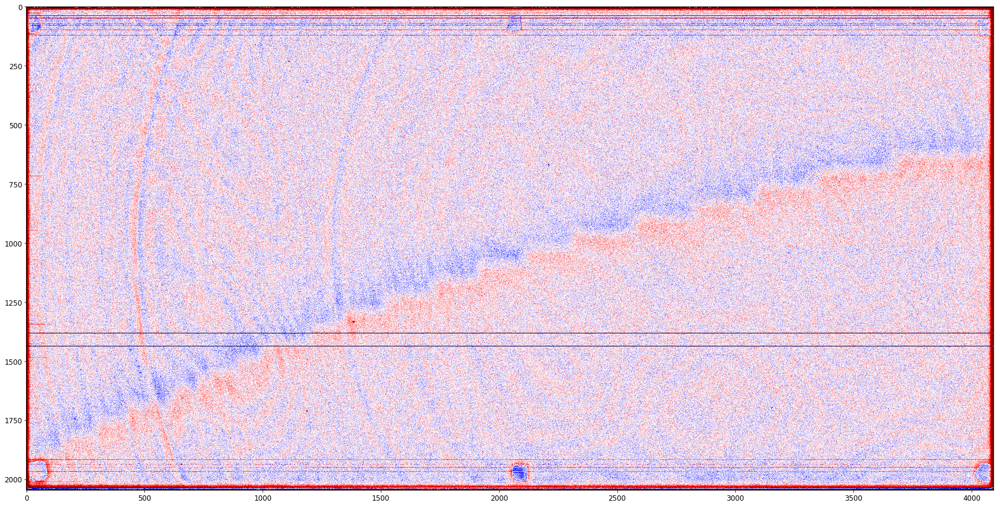

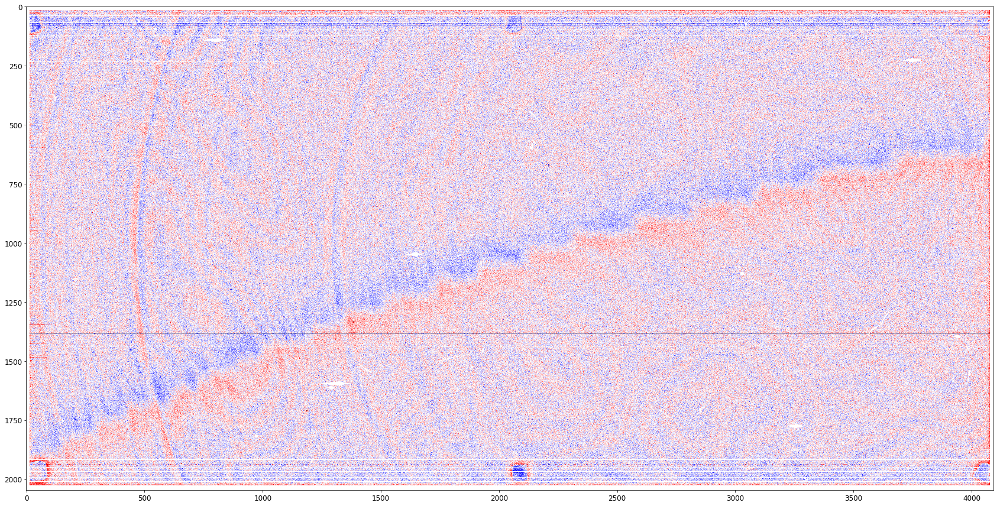

In [6]:
vrange = 4e-3

plt.figure(figsize=(25, 12))
plt.imshow((ood).T, cmap='gray_r', vmin=0, vmax=1)
plt.tight_layout()
plt.show()

plt.figure(figsize=(25, 12))
plt.imshow((fringe).T, cmap='seismic', vmin=-vrange, vmax=vrange)
plt.tight_layout()
plt.show()

plt.figure(figsize=(25, 12))
plt.imshow((fringe_masked).T, cmap='seismic', vmin=-vrange, vmax=vrange)
plt.tight_layout()
plt.show()

In [7]:
nmad = lambda x: 1.4826 * np.median(np.abs(x-np.median(x)))
sky_nmad = nmad(fringe_masked[np.isfinite(fringe_masked)])

mask = (fringe_masked<-5*sky_nmad) | (fringe_masked>5*sky_nmad)
print('Fraction of clipped pixels:', np.sum(mask)/np.sum(np.isfinite(fringe_masked)))

mask = (fringe_masked<-3*sky_nmad) | (fringe_masked>3*sky_nmad)
print('Fraction of clipped pixels:', np.sum(mask)/np.sum(np.isfinite(fringe_masked)))

mask = (fringe_masked<-3*sky_nmad) | (fringe_masked>3*sky_nmad)
fringe_masked[mask] = np.nan

Fraction of clipped pixels: 0.000576578190022
Fraction of clipped pixels: 0.00508697177055


/global/common/software/desi/cori/desiconda/20180709-1.2.6-spec/conda/lib/python3.6/site-packages/ipykernel/__main__.py:4: RuntimeWarning: invalid value encountered in less
/global/common/software/desi/cori/desiconda/20180709-1.2.6-spec/conda/lib/python3.6/site-packages/ipykernel/__main__.py:4: RuntimeWarning: invalid value encountered in greater
/global/common/software/desi/cori/desiconda/20180709-1.2.6-spec/conda/lib/python3.6/site-packages/ipykernel/__main__.py:7: RuntimeWarning: invalid value encountered in less
/global/common/software/desi/cori/desiconda/20180709-1.2.6-spec/conda/lib/python3.6/site-packages/ipykernel/__main__.py:7: RuntimeWarning: invalid value encountered in greater
/global/common/software/desi/cori/desiconda/20180709-1.2.6-spec/conda/lib/python3.6/site-packages/ipykernel/__main__.py:10: RuntimeWarning: invalid value encountered in less
/global/common/software/desi/cori/desiconda/20180709-1.2.6-spec/conda/lib/python3.6/site-packages/ipykernel/__main__.py:10: Runt

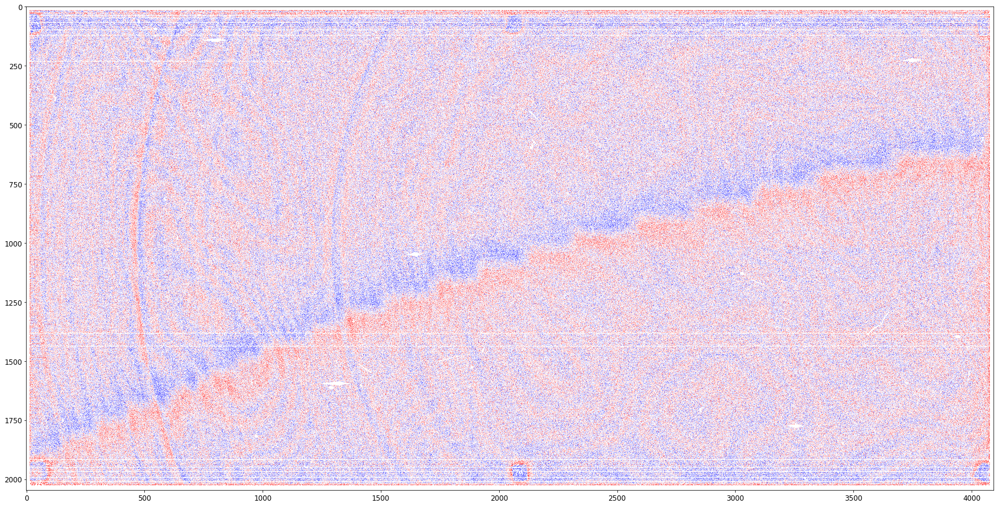

In [8]:
plt.figure(figsize=(25, 12))
plt.imshow((fringe_masked).T, cmap='seismic', vmin=-vrange, vmax=vrange)
plt.tight_layout()
plt.show()

sigma=2.00; equivalent area: 50.26


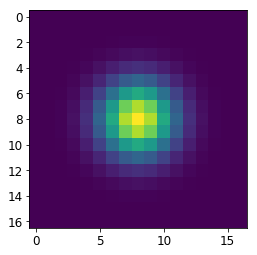

sigma=4.00; equivalent area: 201.03


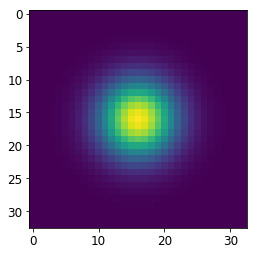

In [9]:
from astropy.convolution import Gaussian2DKernel
from astropy.convolution import convolve

sigma = 2.0
kernel = Gaussian2DKernel(stddev=sigma)
print('sigma={:.2f}; equivalent area: {:.2f}'.format(sigma, np.sum(kernel.array)**2/np.sum(kernel.array**2)))
plt.imshow(kernel)
plt.show()

sigma = 4.0
kernel = Gaussian2DKernel(stddev=sigma)
print('sigma={:.2f}; equivalent area: {:.2f}'.format(sigma, np.sum(kernel.array)**2/np.sum(kernel.array**2)))
plt.imshow(kernel)
plt.show()

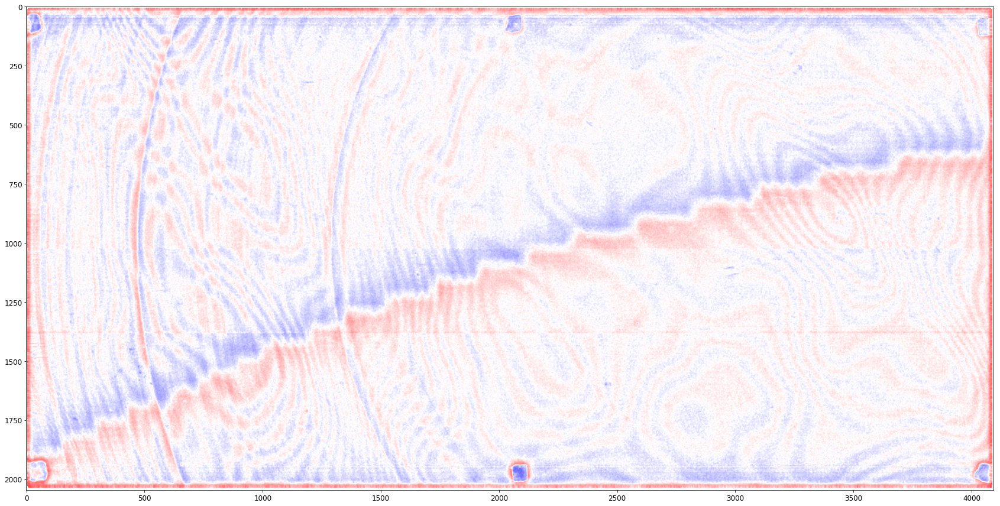

In [10]:
kernel = Gaussian2DKernel(stddev=2)
fringe_smooth = convolve(fringe_masked, kernel, boundary='extend', nan_treatment='interpolate')

plt.figure(figsize=(25, 12))
plt.imshow((fringe_smooth).T, cmap='seismic', vmin=-vrange, vmax=vrange)
plt.tight_layout()
plt.show()

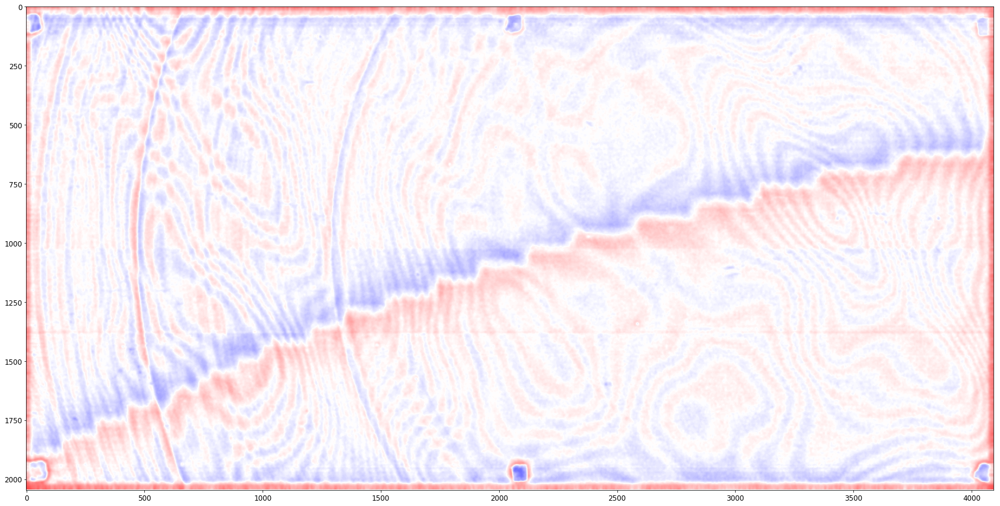

In [11]:
from astropy.convolution import Gaussian2DKernel
from astropy.convolution import convolve

kernel = Gaussian2DKernel(stddev=4)
fringe_smooth = convolve(fringe_masked, kernel, boundary='extend', nan_treatment='interpolate')

plt.figure(figsize=(25, 12))
plt.imshow((fringe_smooth).T, cmap='seismic', vmin=-vrange, vmax=vrange)
plt.tight_layout()
plt.show()

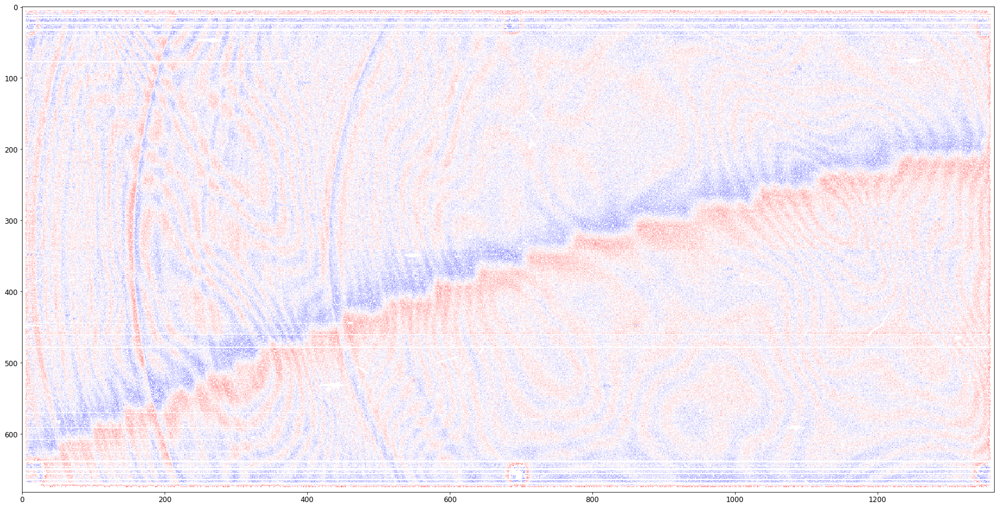

In [12]:
fringe_small = fringe_masked.copy()
trim_size_y = 1
trim_size_x = 0
fringe_small = fringe_small[trim_size_y:(fringe_small.shape[0]-trim_size_y), trim_size_x:(fringe_small.shape[1]-trim_size_x)]
ysize, xsize = fringe_small.shape
binsize = 3
fringe_small = fringe_small.reshape((fringe_small.shape[0]//binsize, binsize, fringe_small.shape[1]//binsize,-1)).mean(axis=3).mean(1)

plt.figure(figsize=(25, 12))
plt.imshow((fringe_small).T, cmap='seismic', vmin=-vrange, vmax=vrange)
plt.tight_layout()
plt.show()

In [14]:
vrange = vrange/1.5

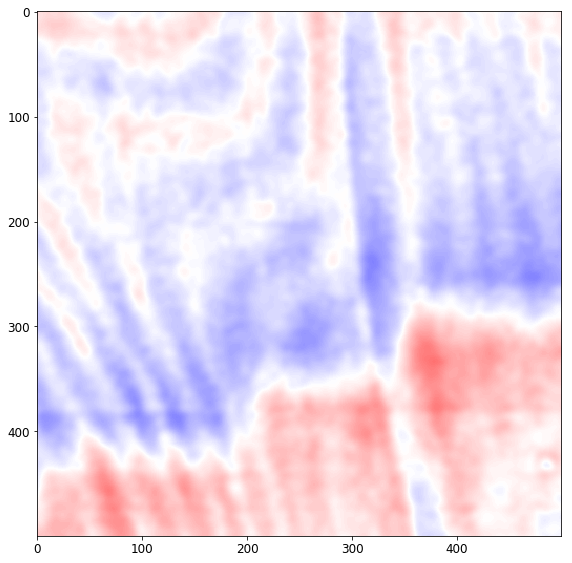

In [15]:
plt.figure(figsize=(8, 8))
plt.imshow((fringe_smooth[1000:1500, 1000:1500]).T, cmap='seismic', vmin=-vrange, vmax=vrange)
plt.tight_layout()
plt.show()

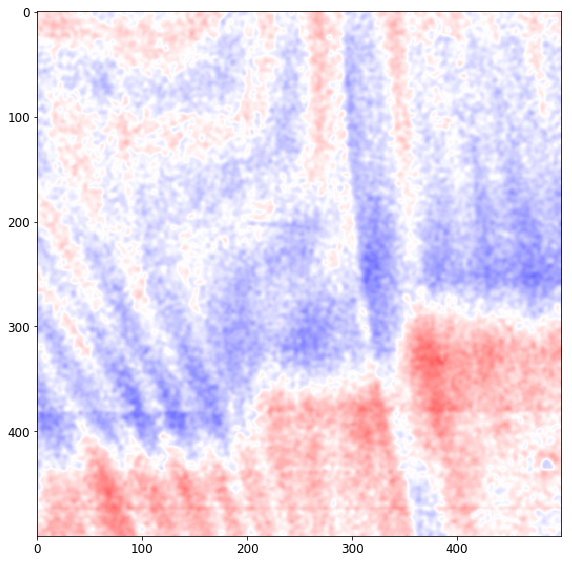

In [18]:
kernel = Gaussian2DKernel(stddev=2)
fringe_smooth = convolve(fringe_masked, kernel, boundary='extend', nan_treatment='interpolate')

plt.figure(figsize=(8, 8))
plt.imshow((fringe_smooth[1000:1500, 1000:1500]).T, cmap='seismic', vmin=-vrange, vmax=vrange)
plt.tight_layout()
plt.show()